# Map Checker

Load any saved gallery JSON and plot the resulting map partition.

### Imports

In [2]:
%load_ext autoreload
%autoreload 2

import json
import geopandas as gpd
from gerrychain import Graph, Partition
import sys
import os
from pathlib import Path
import gzip

# Ensure we are in the project root
if Path.cwd().name == 'analysis':
    os.chdir('..')
sys.path.append(os.getcwd())
from common import plotting
from common import scoring
from gerrychain.updaters import cut_edges, county_splits


### Load Geodata

In [7]:
STATE = 'co'
COI_MAP_PATH = Path('co/data/coi-maps/people_based.geojson')

In [8]:
import pandas as pd
if STATE == 'co':
    vtds = gpd.read_file(f"{STATE}/data/census_vtds/{STATE}.shp")
    cois = gpd.read_file(COI_MAP_PATH)
elif STATE == 'mo':
    vtds = gpd.read_file(f"{STATE}/data/mo-aggregated/mo.shp")
    cois = gpd.read_file(COI_MAP_PATH)
    # drop parent clusters for MO
    if 'cluster' in cois.columns:
        subclusters = cois[cois['cluster'].str.contains('-', na=False)]
        parents_to_drop = subclusters['cluster'].apply(lambda x: x.split('-')[0]).unique()
        cois = cois[~cois['cluster'].isin(parents_to_drop)]
else:
    raise ValueError(f"Paths for state '{STATE}' are not configured yet.")

if cois.crs != vtds.crs:
    cois = cois.to_crs(vtds.crs)

# universal coi id lookup to match init_data.py
def get_coi_id(row):
    for col in ['entry_ID', 'cluster', 'GEOID', 'OBJECTID', 'id', 'NAME']:
        val = row.get(col)
        if pd.notna(val) and str(val).strip() and str(val) not in ('None', 'nan', ''):
            return str(val).strip()
    return f'coi_{row.name}'

cois['community_id'] = cois.apply(get_coi_id, axis=1)
cois = cois[['community_id', 'geometry']].copy()
cluster_col = 'community_id'

vtds['TOTVOTES20'] = vtds['PRE20D'] + vtds['PRE20R'] + vtds['PRE20O']
vtds['vtd_area'] = vtds.geometry.area

overlaps = gpd.overlay(vtds, cois, how='intersection')
overlaps['coi_fraction'] = overlaps.geometry.area / overlaps['vtd_area']

clean_overlaps = overlaps[overlaps['coi_fraction'] > 0.01].copy()
clean_overlaps['coi_pop'] = clean_overlaps['TOTPOP'] * clean_overlaps['coi_fraction']

coi_dict = {}
for index, row in clean_overlaps.iterrows():
    vtd_name = row['NAME20']
    c_id = str(row['community_id'])
    pop_chunk = row['coi_pop']
    if vtd_name not in coi_dict:
        coi_dict[vtd_name] = {}
    coi_dict[vtd_name][c_id] = {
        'pop': pop_chunk,
        'category': 'coi'
    }

vtds['COI_POPS'] = [coi_dict.get(name, {}) for name in vtds['NAME20']]

with open('weights/test_weights.json', 'r') as f:
    state_weights = json.load(f)
vtds.geometry = vtds.geometry.buffer(0)
g = Graph.from_geodataframe(vtds)
g.graph['WEIGHT_MAP'] = state_weights


### Logistic Regression Line of Best Fit Residuals

In [9]:
CSV_PATH = Path('analysis/results/tcp/people_based/cog/county_55_coi_0/colorado_cog_people_based_simple_37_5_test_weights_250000_v1.csv')

<Figure size 800x500 with 0 Axes>

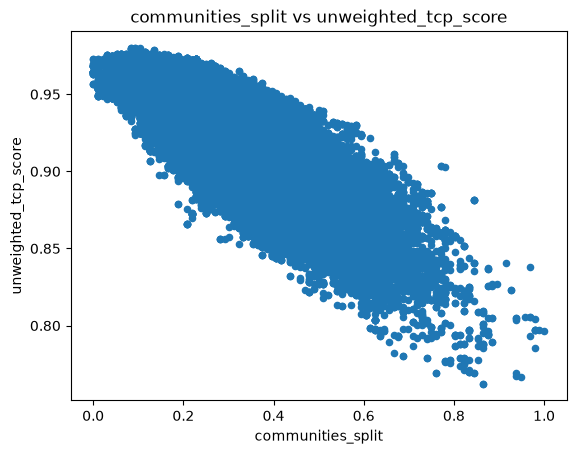

Largest Positive Residual:
       communities_split  unweighted_tcp_score  Residuals
56597            0.78125              0.903107    0.07081

Largest Negative Residual:
       communities_split  unweighted_tcp_score  Residuals
37010           0.208333              0.866144  -0.077607

Extreme Left Point:
       communities_split  unweighted_tcp_score   Y_pred
94447                0.0              0.969513  0.98428

Extreme Right Point:
        communities_split  unweighted_tcp_score    Y_pred
137139                1.0              0.796712  0.789742



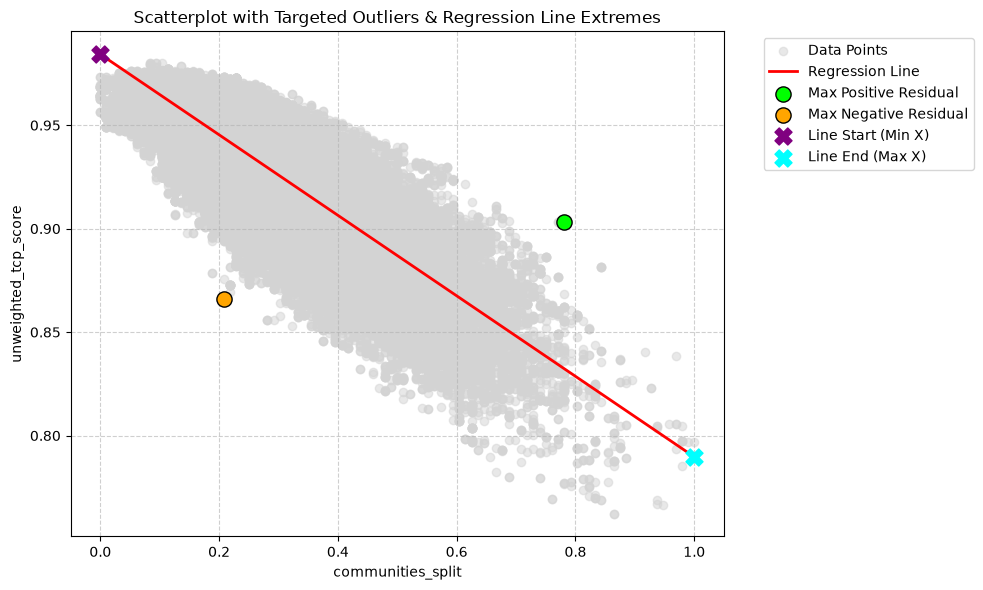

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# cols we are interested in measuring
cols = ['weighted_tcp_score', 'unweighted_tcp_score', 'communities_split', 'community_fragments', 'county_split_count', 'county_fragments', 'effective_splits', 'sr_entropy', 'shannon_entropy', 'even_splits', 'cut_edges', 'dem_wins']
#put whatever csv dataframe in here
df = pd.read_csv(CSV_PATH)
# normalize any column that has a max greater than 1
for col in cols:
    if(df[col].max() > 1):
        df[col] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())


x_axis = "communities_split"
y_axis = "unweighted_tcp_score"

# initial scatter
plt.figure(figsize=(8, 5))
df.plot.scatter(x=x_axis, y=y_axis, title=f'{x_axis} vs {y_axis}')
plt.show()


X = df[[x_axis]] 
y = df[y_axis]   
model = LinearRegression()
model.fit(X, y)

df['Y_pred'] = model.predict(X)
df['Residuals'] = df[y_axis] - df['Y_pred']

#Largest Positive Residual (Point furthest above the line)
idx_pos_res = df['Residuals'].idxmax()
pos_residual = df.loc[[idx_pos_res]]

#Largest Negative Residual (Point furthest below the line)
idx_neg_res = df['Residuals'].idxmin()
neg_residual = df.loc[[idx_neg_res]]

#Extreme Left Line Point (Minimum X value on the line)
idx_min_x = df[x_axis].idxmin()
line_start = df.loc[[idx_min_x]]

# Extreme Right Line Point (Maximum X value on the line)
idx_max_x = df[x_axis].idxmax()
line_end = df.loc[[idx_max_x]]


print(f"Largest Positive Residual:\n{pos_residual[[x_axis, y_axis, 'Residuals']]}\n")
print(f"Largest Negative Residual:\n{neg_residual[[x_axis, y_axis, 'Residuals']]}\n")
print(f"Extreme Left Point:\n{line_start[[x_axis, y_axis, 'Y_pred']]}\n")
print(f"Extreme Right Point:\n{line_end[[x_axis, y_axis, 'Y_pred']]}\n")


# Graph the Scatterplot and Regression Line
plt.figure(figsize=(10, 6))

# Main plot components
plt.scatter(df[x_axis], df[y_axis], 
            color='lightgray', alpha=0.5, label='Data Points')

# Sorting X ensures the line draws smoothly from left to right
sorted_df = df.sort_values(by=x_axis)
plt.plot(sorted_df[x_axis], sorted_df['Y_pred'], 
         color='red', linewidth=2, label='Regression Line')

# Highlight the Specific Residuals
plt.scatter(pos_residual[x_axis], pos_residual[y_axis], 
            color='lime', edgecolor='black', s=120, zorder=5, label='Max Positive Residual')
plt.scatter(neg_residual[x_axis], neg_residual[y_axis], 
            color='orange', edgecolor='black', s=120, zorder=5, label='Max Negative Residual')

# Highlight the Extreme Line Points (plotting their Y_pred positions to sit perfectly on the line)
plt.scatter(line_start[x_axis], line_start['Y_pred'], 
            color='purple', marker='X', s=150, zorder=5, label='Line Start (Min X)')
plt.scatter(line_end[x_axis], line_end['Y_pred'], 
            color='cyan', marker='X', s=150, zorder=5, label='Line End (Max X)')

# Formatting the plot
plt.title('Scatterplot with Targeted Outliers & Regression Line Extremes')
plt.xlabel(x_axis)
plt.ylabel(y_axis)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Moves legend outside box so it is readable
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### Load a Saved Map

In [20]:
GALLERY_PATH = 'analysis/gallery/tcp/people_based/cog/county_55_coi_0/colorado_cog_people_based_simple_37_5_test_weights_250000_v1'
TARGET_STEP = 56597 

In [22]:
assignment = {}

if os.path.isdir(GALLERY_PATH):
    with open(os.path.join(GALLERY_PATH, 'base_assignment.json'), 'r') as f:
        assignment = json.load(f)
    
    if TARGET_STEP > 0:
        diff_path = os.path.join(GALLERY_PATH, 'diffs.jsonl.gz')
        if not os.path.exists(diff_path):
            diff_path = os.path.join(GALLERY_PATH, 'diffs.jsonl')
        
        if os.path.exists(diff_path):
            opener = gzip.open if diff_path.endswith('.gz') else open
            mode = 'rt' if diff_path.endswith('.gz') else 'r'
            with opener(diff_path, mode, encoding='utf-8') as f:
                for i, line in enumerate(f):
                    if i == TARGET_STEP:
                        break
                    diff = json.loads(line)
                    for k, v in diff.items():
                        if isinstance(v, list):
                            try:
                                dist_val = int(k)
                            except ValueError:
                                dist_val = k
                            for node in v:
                                assignment[str(node)] = dist_val
                        else:
                            assignment[str(k)] = v
elif str(GALLERY_PATH).endswith('.gz'):
    with gzip.open(GALLERY_PATH, 'rt') as f:
        for i, line in enumerate(f):
            if i == TARGET_STEP:
                assignment = json.loads(line)
                break
else:
    raise ValueError(f"{GALLERY_PATH} must be a directory containing base_assignment.json/diffs.jsonl(.gz) OR a legacy .jsonl.gz file")

assignment_int_keys = {int(k): v for k, v in assignment.items()}

updaters_dict = { 
    '_coi_state': scoring.coi_district_pops,
    '_partisan': scoring.partisan_data, 
    'unweighted_tcp_score': scoring.calculate_unweighted_tcp,
    'weighted_tcp_score': scoring.calculate_weighted_tcp,
    'communities_split': scoring.communities_split,
    'effective_splits': scoring.effective_splits,
    'sr_entropy': scoring.square_root_entropy,
    'shannon_entropy': scoring.shannon_entropy,
    'even_splits': scoring.even_splits,
    'cut_edges': cut_edges,
    'dem_wins': scoring.count_dem_wins,
    'dem_share': scoring.dem_share,
    'dem_box': scoring.dem_boxes,
    'county_splits': county_splits('county_splits', 'COUNTYFP20'),
    'county_split_count': scoring.count_county_splits,
    'county_fragments': scoring.count_county_fragments,
    'community_fragments': scoring.community_fragments
}

partition = Partition(g, assignment=assignment_int_keys, updaters=updaters_dict)


### Plot the Map

In [23]:
if 'community_id' in cois.columns:
    cluster_col = 'community_id'
else:
    cluster_col = 'entry_ID' if STATE == 'co' else 'cluster'

plotting.plot_partition_detailed(
    partition=partition, 
    vtds_gdf=vtds, 
    cois_gdf=cois, 
    title=f"Gallery Map: Step {TARGET_STEP}",
    cluster_col=cluster_col
)

In [63]:
# can also look at the simple plot
# plotting.plot_partition(partition, vtds, cois, title=f"Gallery Map: Step {TARGET_STEP}")

### Partition Scores
View the calculated metric scores for this specific map.

In [39]:
print(f"Target Step Loaded: {TARGET_STEP}")
print("="*30)
print(f"Weighted TCP Score: {partition['weighted_tcp_score']:.4f}")
print(f"Unweighted TCP Score: {partition['unweighted_tcp_score']:.4f}")
print(f"Total Communities Split: {partition['communities_split']}")
print(f"Effective Splits: {partition['effective_splits']:.4f}")
print(f"Square Root Entropy: {partition['sr_entropy']:.4f}")
print(f"Shannon Entropy: {partition['shannon_entropy']:.4f}")
print(f"Even Splits: {partition['even_splits']:.4f}")
print("="*30)
print(f"County Split Count: {partition['county_split_count']}")
print(f"Cut Edges Count: {len(partition['cut_edges'])}")
print("="*30)
print(f"Democratic Wins (Seats): {partition['dem_wins']}")
print("Dem Share by District:")
for i, share in enumerate(partition['dem_share']):
    print(f"  District {i+1}: {share:.2%}")


Target Step Loaded: 15
Weighted TCP Score: 0.8596
Unweighted TCP Score: 0.8507
Total Communities Split: 95
Effective Splits: 0.4436
Square Root Entropy: 368.6784
Shannon Entropy: 60.4259
Even Splits: 163.4742
County Split Count: 16
Cut Edges Count: 663
Democratic Wins (Seats): 5
Dem Share by District:
  District 1: 40.95%
  District 2: 41.63%
  District 3: 47.57%
  District 4: 53.54%
  District 5: 54.06%
  District 6: 58.08%
  District 7: 67.19%
  District 8: 79.10%
